<>:41: SyntaxWarning: invalid escape sequence '\s'
<>:41: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-3989715193.py:41: SyntaxWarning: invalid escape sequence '\s'
  text = re.sub('\s+', ' ', text)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total captions: 40455
                                            image  \
0  /content/data/Images/1000268201_693b08cb0e.jpg   
1  /content/data/Images/1000268201_693b08cb0e.jpg   
2  /content/data/Images/1000268201_693b08cb0e.jpg   
3  /content/data/Images/1000268201_693b08cb0e.jpg   
4  /content/data/Images/1000268201_693b08cb0e.jpg   

                                             caption  
0  <start> a child in a pink dress is climbing up...  
1  <start> a girl going into a wooden building <end>  
2  <start> a little girl climbing into a wooden p...  
3  <start> a little girl climbing the stairs to h...  
4  <start> a little girl in a pink dress going in...  
Training: 32360 samples
Validation: 8095 samples

STARTING TRAINING
Epoch 1/6
506/506 ━━━━━━━━━━━━━━━━━━━━ 287s 509ms/step - acc: 0.2620 - loss: 4.5859 - val_acc: 0.3681 - val_loss: 3.2834
Epoch 2/6
5

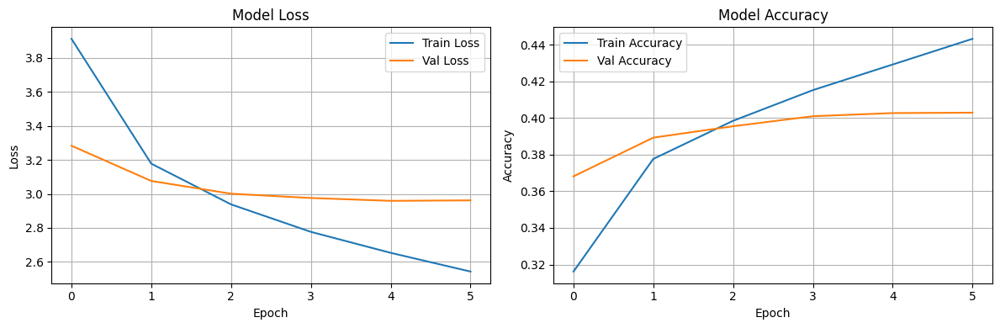


TESTING ON RANDOM VALIDATION IMAGES

Image 1:
True: small boy holding is arm out to balance himself while he goes down the fairground slide
Pred: blue sandals magazines belt playhouse festive wallride over dew crawling floats straining tables cats blood shaft someone reading nets circuit most evening jogger confetti walls daring martial waking structure obedience sippy eyeglasses close grabbing saddle bathtub relax policewoman fours


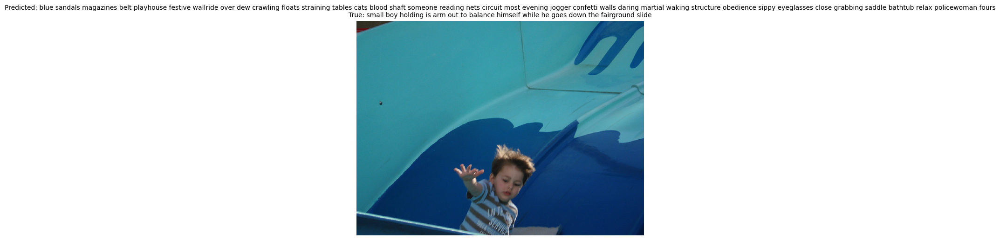


Image 2:
True: a man in a white shirt and helmet is using climbing equipment
Pred: among polaris board sinks tops drivers whips ankle fresh whack highway ancient curly bin calm florist landscape stretching chairlift mardi crying cup tackle chaps narrow block carts windsurfer bigger camouflage stroller sinks surrounded foal jesus vast ground extended show


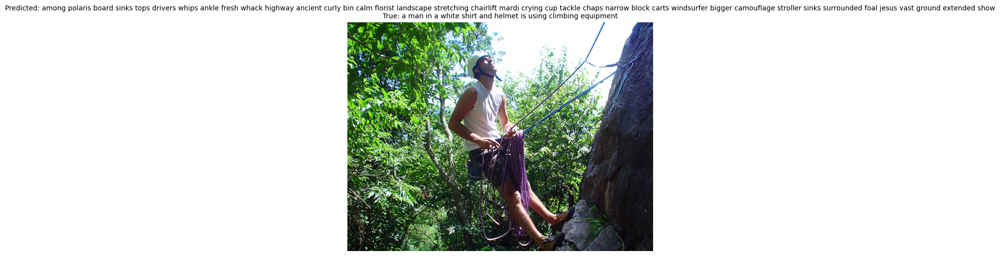


Image 3:
True: two boys hanging off a tire dock
Pred: broom scratches laundry ribbons higher oppose fatigues stained guarding containers denim intently grasps setup outfit einstein sunrise snuggles onto winks blossoms horns mirror breaking mitten faces onlookers loop gathered sparkling their ruins policewoman ski medieval goalie cycling dangles giant


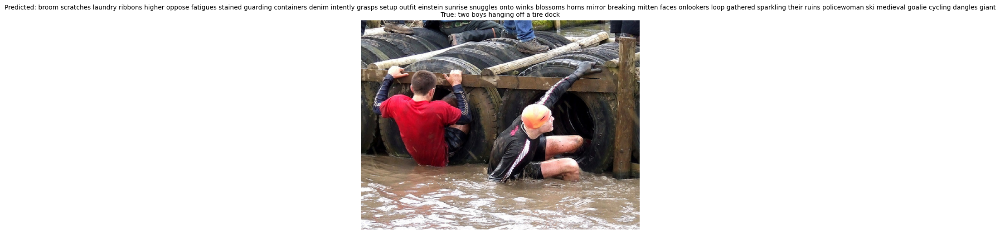


Image 4:
True: a man is squirting water into a white dog s mouth with a squirt gun
Pred: icing wolflike what drinking colander playgroud tire retail frolics selling scared glowing mustard dresses pearls left flinging marshy turn pretend greets end toss school prairie safari protectors carring rainy mills goggles fame lies timeout holds excitement lap beat goal


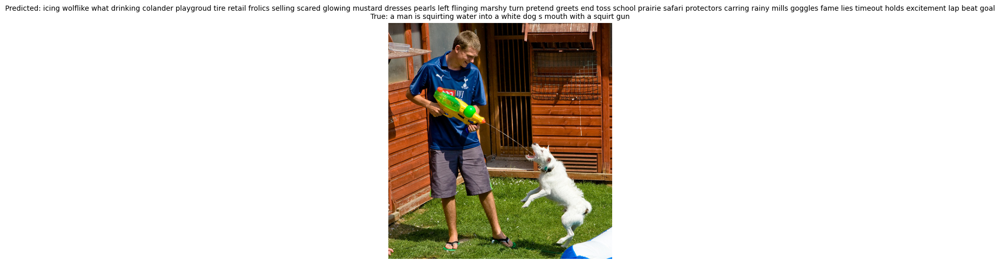


Image 5:
True: person on bike in air above two large boulders with sun overhead
Pred: dune toolbox root leaves chased motorbikes tartan facepaint reading offcamera rolled drenched climbers directs exhibit halfpipe rolled vert walking lollipop ferns barn huddled shoppers maneuvers mean style wraps squares pelicans shoes piste piste upside cloth huge obama golf peeks


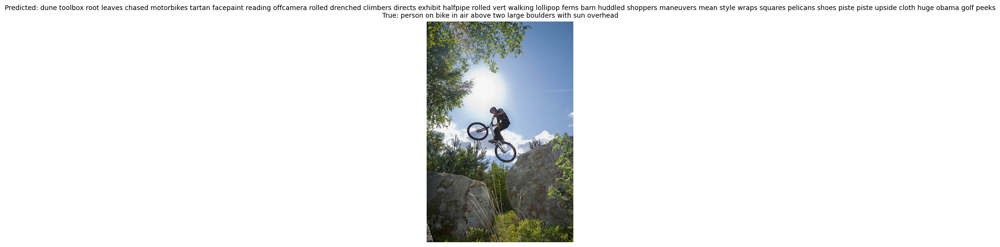


Image 6:
True: a black dog runs with its tongue out
Pred: engaged saddle motorcycles wasteland lunges petals she uphill muffs book laugh struck wave u rottweiler guarding patio sight strips cute muscle patches dwelling bared crosslegged kite bike underwater easel eastpak amongst field drill daughters shakes pillar goose diner toboggan


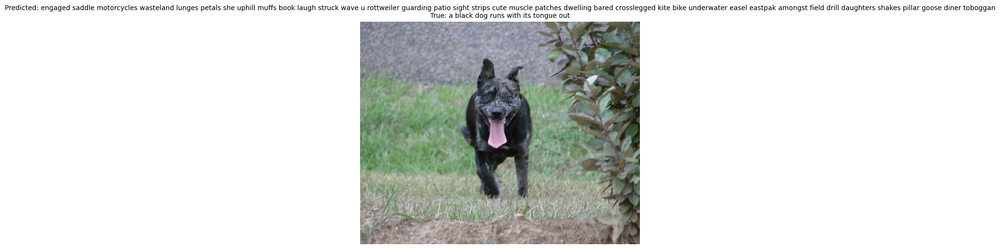


Image 7:
True: a man with a shaved head and sunglasses smiles broadly
Pred: cutting expressions victory nine robot grove professional racer skating bouquet pulled barefooted document midflight midleap papers furnace public learns stores stores slicker flipflops puzzled skiing elder carpeted baseman moonwalk extremely handinhand go batter shake real asking another eggs strips


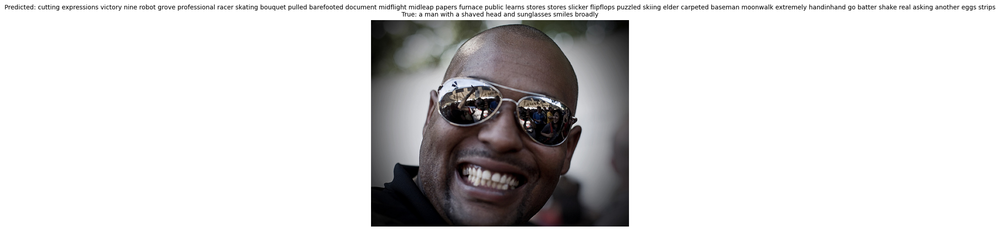


Image 8:
True: the brown dog is running along a grassy pathway
Pred: atm springs kart steep post steep loading teacher grounded racetrack graphic naked obstacle columns hulahoops stunning being some decorative africanamerican salvar parent walls saber extends measured bottle dug sat herding interior rushing case doorbell shoots dive locking potted read


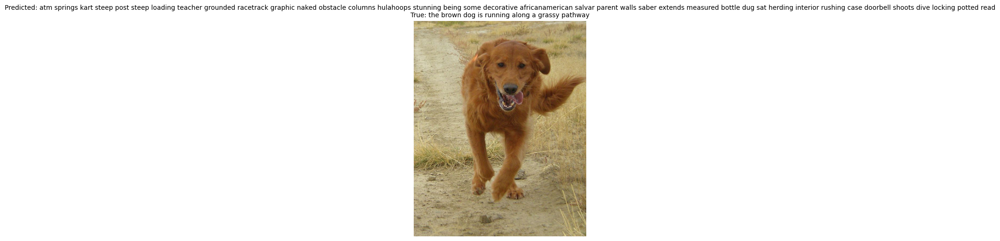


Image 9:
True: the dog is fetching a stick in water
Pred: is parents hound wool of doors so iced eggs observes yorkshire


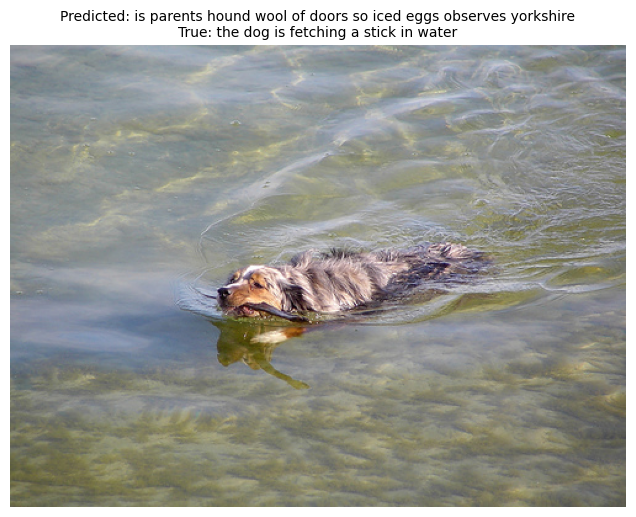


Image 10:
True: a woman skies
Pred: approach oklahoma cow beat meandering pokemon singer grasses sequins night called sprawled priests kawasaki sticks collar vault gesturing snowboards ladle trousers vaults into master threw work applying backtoback quietly hunched enthusiastically casually root mardi lease darkly bread drenched walker


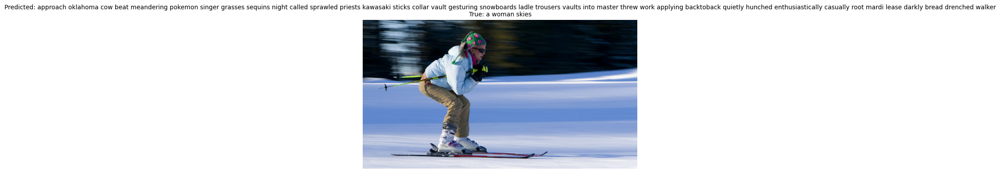


✅ Training complete! Model saved to Google Drive.


In [ ]:
!pip -q install kaggle

import tensorflow as tf
import os
import json
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import collections
import random
from PIL import Image
from tqdm.auto import tqdm
from google.colab import drive

# Mount drive
drive.mount('/content/drive')

# Download and setup dataset
if not os.path.exists('/content/data/'):
    api_token = {"username": "a459shivanshadubey",
                 "key": "9311457161eadb412549101c6b7e06f1"}

    with open('/content/kaggle.json', 'w') as file:
        json.dump(api_token, file)

    os.environ["KAGGLE_CONFIG_DIR"] = "/content/"
    os.system('kaggle datasets download -d adityajn105/flickr8k')
    os.makedirs('/content/data/', exist_ok=True)
    os.system('mv /content/flickr8k.zip /content/data/flickr8k.zip')
    os.system('unzip -q /content/data/flickr8k.zip -d /content/data/')
    os.remove('/content/data/flickr8k.zip')

# Load and preprocess captions
captions = pd.read_csv('/content/data/captions.txt')
captions['image'] = captions['image'].apply(lambda x: f'/content/data/Images/{x}')

def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip()
    text = '<start> ' + text + ' <end>'
    return text

captions['caption'] = captions['caption'].apply(preprocess)
print(f"Total captions: {len(captions)}")
print(captions.head())

# Constants - OPTIMIZED
MAX_LENGTH = 40
VOCABULARY_SIZE = 5000  
BATCH_SIZE = 64 
BUFFER_SIZE = 1000
EMBEDDING_DIM = 256  
UNITS = 512
NUM_HEADS = 8

# Setup tokenizer
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=VOCABULARY_SIZE,
    standardize=None,
    output_sequence_length=MAX_LENGTH)

tokenizer.adapt(captions['caption'])

word2idx = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())

idx2word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

# Train/val split
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(captions['image'], captions['caption']):
    img_to_cap_vector[img].append(cap)

img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys) * 0.8)
img_name_train_keys = img_keys[:slice_index]
img_name_val_keys = img_keys[slice_index:]

train_imgs = []
train_captions = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    train_imgs.extend([imgt] * capt_len)
    train_captions.extend(img_to_cap_vector[imgt])

val_imgs = []
val_captions = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    val_imgs.extend([imgv] * capv_len)
    val_captions.extend(img_to_cap_vector[imgv])

print(f"Training: {len(train_imgs)} samples")
print(f"Validation: {len(val_imgs)} samples")

# Create datasets
def load_data(img_path, caption):
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(299, 299)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    caption = tokenizer(caption)
    return img, caption

train_dataset = tf.data.Dataset.from_tensor_slices((train_imgs, train_captions))
train_dataset = train_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((val_imgs, val_captions))
val_dataset = val_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


# CNN Encoder
def CNN_Encoder():
    inception_v3 = tf.keras.applications.InceptionV3(
        include_top=False,
        weights='imagenet'
    )
    inception_v3.trainable = False

    output = inception_v3.output
    output = tf.keras.layers.Reshape((-1, output.shape[-1]))(output)

    cnn_model = tf.keras.models.Model(inception_v3.input, output)
    return cnn_model


# Transformer Encoder Layer 
class TransformerEncoderLayer(tf.keras.layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.layer_norm_1 = tf.keras.layers.LayerNormalization()
        self.layer_norm_2 = tf.keras.layers.LayerNormalization()
        self.attention = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim)
        self.dense = tf.keras.layers.Dense(embed_dim, activation="relu")

    def call(self, x, training):
        x = self.layer_norm_1(x)
        x = self.dense(x)

        attn_output = self.attention(
            query=x,
            value=x,
            key=x,
            attention_mask=None,
            training=training
        )

        x = self.layer_norm_2(x + attn_output)
        return x


# Embeddings Layer
class Embeddings(tf.keras.layers.Layer):
    def __init__(self, vocab_size, embed_dim, max_len):
        super().__init__()
        self.token_embeddings = tf.keras.layers.Embedding(vocab_size, embed_dim)
        self.position_embeddings = tf.keras.layers.Embedding(max_len, embed_dim)

    def call(self, input_ids):
        length = tf.shape(input_ids)[-1]
        position_ids = tf.range(start=0, limit=length, delta=1)
        position_ids = tf.expand_dims(position_ids, axis=0)

        token_embeddings = self.token_embeddings(input_ids)
        position_embeddings = self.position_embeddings(position_ids)

        return token_embeddings + position_embeddings


# Transformer Decoder Layer 
class TransformerDecoderLayer(tf.keras.layers.Layer):
    def __init__(self, embed_dim, units, num_heads):
        super().__init__()
        self.embedding = Embeddings(
            tokenizer.vocabulary_size(), embed_dim, MAX_LENGTH)

        self.attention_1 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.attention_2 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )

        self.layernorm_1 = tf.keras.layers.LayerNormalization()
        self.layernorm_2 = tf.keras.layers.LayerNormalization()
        self.layernorm_3 = tf.keras.layers.LayerNormalization()

        self.ffn_layer_1 = tf.keras.layers.Dense(units, activation="relu")
        self.ffn_layer_2 = tf.keras.layers.Dense(embed_dim)

        self.out = tf.keras.layers.Dense(
            tokenizer.vocabulary_size(), activation="softmax")

        self.dropout_1 = tf.keras.layers.Dropout(0.3)
        self.dropout_2 = tf.keras.layers.Dropout(0.5)

    def call(self, input_ids, encoder_output, training, mask=None):
        embeddings = self.embedding(input_ids)

        combined_mask = None
        padding_mask = None

        if mask is not None:
            causal_mask = self.get_causal_attention_mask(embeddings)
            padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
            combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
            combined_mask = tf.minimum(combined_mask, causal_mask)

        # Self-attention
        attn_output_1 = self.attention_1(
            query=embeddings,
            value=embeddings,
            key=embeddings,
            attention_mask=combined_mask,
            training=training
        )

        out_1 = self.layernorm_1(embeddings + attn_output_1)

        # Cross-attention with encoder output
        attn_output_2 = self.attention_2(
            query=out_1,
            value=encoder_output,
            key=encoder_output,
            attention_mask=padding_mask,
            training=training
        )

        out_2 = self.layernorm_2(out_1 + attn_output_2)

        # Feed-forward network
        ffn_out = self.ffn_layer_1(out_2)
        ffn_out = self.dropout_1(ffn_out, training=training)
        ffn_out = self.ffn_layer_2(ffn_out)

        ffn_out = self.layernorm_3(ffn_out + out_2)
        ffn_out = self.dropout_2(ffn_out, training=training)
        preds = self.out(ffn_out)
        return preds

    def get_causal_attention_mask(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size, sequence_length = input_shape[0], input_shape[1]
        i = tf.range(sequence_length)[:, tf.newaxis]
        j = tf.range(sequence_length)
        mask = tf.cast(i >= j, dtype="int32")
        mask = tf.reshape(mask, (1, input_shape[1], input_shape[1]))
        mult = tf.concat(
            [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)],
            axis=0
        )
        return tf.tile(mask, mult)



class ImageCaptioningModel(tf.keras.Model):
    def __init__(self, cnn_model, encoder, decoder):
        super().__init__()
        self.cnn_model = cnn_model
        self.encoder = encoder
        self.decoder = decoder
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.acc_tracker = tf.keras.metrics.Mean(name="accuracy")

    def calculate_loss(self, y_true, y_pred, mask):
        loss = self.loss(y_true, y_pred)
        mask = tf.cast(mask, dtype=loss.dtype)
        loss *= mask
        return tf.reduce_sum(loss) / tf.reduce_sum(mask)

    def calculate_accuracy(self, y_true, y_pred, mask):
        accuracy = tf.equal(y_true, tf.argmax(y_pred, axis=2))
        accuracy = tf.math.logical_and(mask, accuracy)
        accuracy = tf.cast(accuracy, dtype=tf.float32)
        mask = tf.cast(mask, dtype=tf.float32)
        return tf.reduce_sum(accuracy) / tf.reduce_sum(mask)

    def compute_loss_and_acc(self, img_embed, captions, training=True):
        
        encoder_output = self.encoder(img_embed, training=training)
        y_input = captions[:, :-1]
        y_true = captions[:, 1:]
        mask = (y_true != 0)
        y_pred = self.decoder(
            y_input, encoder_output, training=training, mask=mask
        )
        loss = self.calculate_loss(y_true, y_pred, mask)
        acc = self.calculate_accuracy(y_true, y_pred, mask)
        return loss, acc

    def train_step(self, batch):
        imgs, captions = batch
        img_embed = self.cnn_model(imgs)

        with tf.GradientTape() as tape:
            loss, acc = self.compute_loss_and_acc(
                img_embed, captions, training=True
            )

        train_vars = (
            self.encoder.trainable_variables + self.decoder.trainable_variables
        )
        grads = tape.gradient(loss, train_vars)
        self.optimizer.apply_gradients(zip(grads, train_vars))
        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)

        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    def test_step(self, batch):
        imgs, captions = batch
        img_embed = self.cnn_model(imgs)

        loss, acc = self.compute_loss_and_acc(
            img_embed, captions, training=False
        )

        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)

        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker, self.acc_tracker]


encoder = TransformerEncoderLayer(EMBEDDING_DIM, NUM_HEADS)
decoder = TransformerDecoderLayer(EMBEDDING_DIM, UNITS, NUM_HEADS)
cnn_model = CNN_Encoder()

caption_model = ImageCaptioningModel(
    cnn_model=cnn_model,
    encoder=encoder,
    decoder=decoder
)

cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=False, reduction="none"
)

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=1000,
    decay_rate=0.96
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    patience=3,
    restore_best_weights=True,
    monitor='val_loss'
)

caption_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    loss=cross_entropy
)

# Train
print("\n" + "="*80)
print("STARTING TRAINING")
print("="*80)

history = caption_model.fit(
    train_dataset,
    epochs=6,  
    validation_data=val_dataset,
    callbacks=[early_stopping]
)

print("\n✅ Training completed with early stopping!")


plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['acc'], label='Train Accuracy')
plt.plot(history.history['val_acc'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



def load_image_from_path(img_path):
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.cast(img, tf.float32)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img

def generate_caption(img_path, max_length=MAX_LENGTH):
    # Load and encode image
    img = load_image_from_path(img_path)
    img = tf.expand_dims(img, axis=0)

    img_embed = caption_model.cnn_model(img)
    img_encoded = caption_model.encoder(img_embed, training=False)

    # Start caption generation
    y_inp = '<start>'
    for i in range(max_length - 1):
        tokenized = tokenizer([y_inp])
        mask = tf.cast(tokenized != 0, tf.int32)

        pred = caption_model.decoder(
            tokenized, img_encoded, training=False, mask=mask
        )

        pred_logits = pred[0, -1, :]
        temperature = 0.7
        pred_logits = pred_logits / temperature
        pred_idx = tf.random.categorical(tf.expand_dims(pred_logits, 0), 1)[0, 0].numpy()

        pred_word = idx2word(pred_idx).numpy().decode('utf-8')

        if pred_word == '<end>' or pred_word == '':
            break

        y_inp += ' ' + pred_word

    y_inp = y_inp.replace('<start> ', '').replace(' <end>', '')
    return y_inp


# Test on random images
print("\n" + "="*80)
print("TESTING ON RANDOM VALIDATION IMAGES")
print("="*80)

for i in range(10):
    idx = random.randint(0, len(val_imgs) - 1)
    img_path = val_imgs[idx]
    true_caption = val_captions[idx].replace('<start> ', '').replace(' <end>', '')

    pred_caption = generate_caption(img_path)

    print(f"\nImage {i+1}:")
    print(f"True: {true_caption}")
    print(f"Pred: {pred_caption}")

    img = Image.open(img_path)
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f"Predicted: {pred_caption}\nTrue: {true_caption}", fontsize=10)
    plt.axis('off')
    plt.show()

print("\n✅ Training complete! Model saved to Google Drive.")

Evaluating on 500 validation samples...


  0%|          | 0/500 [00:00<?, ?it/s]


EVALUATION RESULTS
BLEU-1      : 0.0025
BLEU-2      : 0.0008
BLEU-3      : 0.0006
BLEU-4      : 0.0005
METEOR      : 0.0173
ROUGE-L     : 0.0058


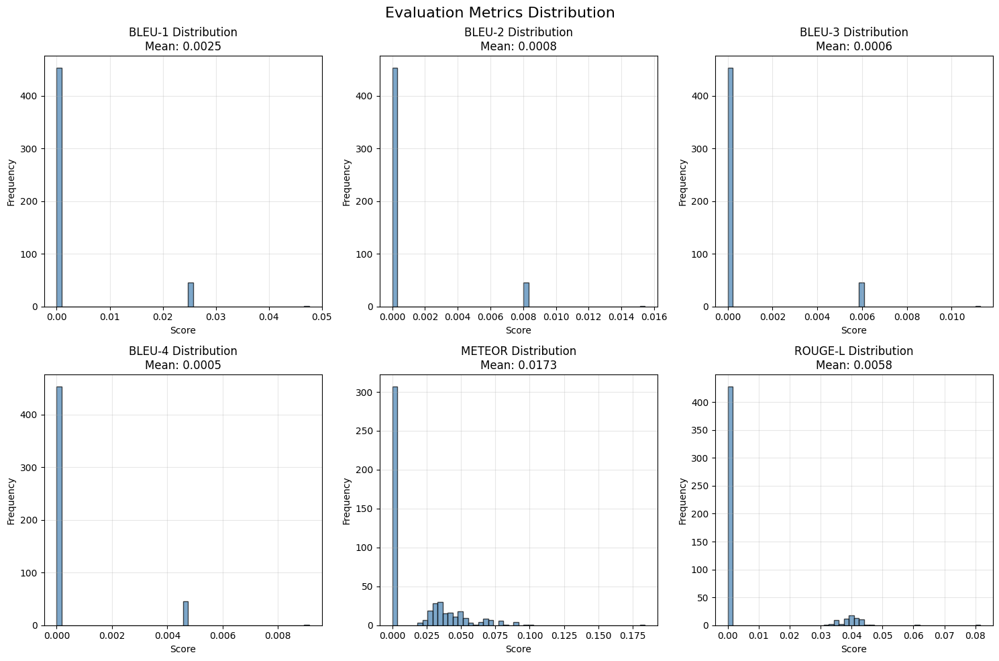


SAMPLE PREDICTIONS WITH SCORES

True Caption: a person rides a moped while women sit on a bench surrounded by pigeons
Pred Caption: blonde damaged toothbrush scenic town grappling trailing mulch crowded pursuing casually waders views mustached closeup tag hips winnie growling mud shower handbag milk steam hulahoops tugging observes louis castle woven treat obstacles cream motorcycles pencil toe hearts photographs snowing
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.000 | ROUGE-L: 0.000


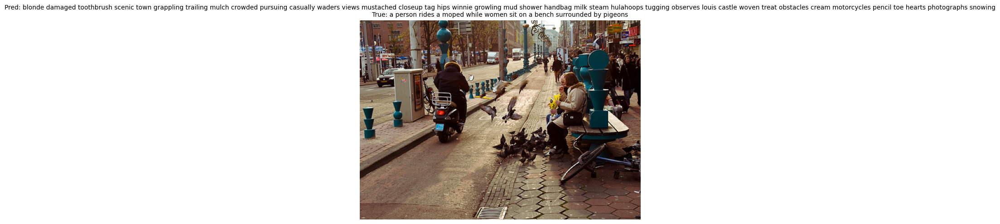


True Caption: a man in a blue shirt looking to his right
Pred Caption: tackles holding series sailor flung slicker open bows statute coat harnessed creating muzzles jeep paperwork goofy gal wear banks squirrel strong skills chat romp hang lot surrounding purse suited rabbit garment bride curious sings shamrocks claus crazy navigate bags
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.000 | ROUGE-L: 0.000


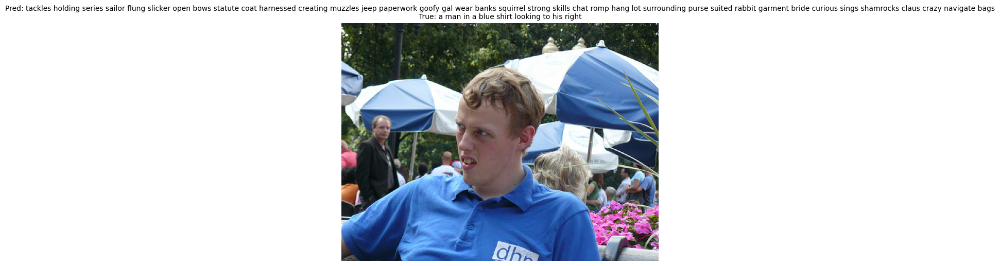


True Caption: a bald man in a tank top riding bike through a city
Pred Caption: mounted pile amish garment bride outstretched shovel took football piggy island arched free checkered treat jack acting fedex says sizes spout shawls footballer drivers panel treks pocket sox poster remote union pursued beverage snowboards wrestle squinting period speeding over
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.034 | ROUGE-L: 0.000


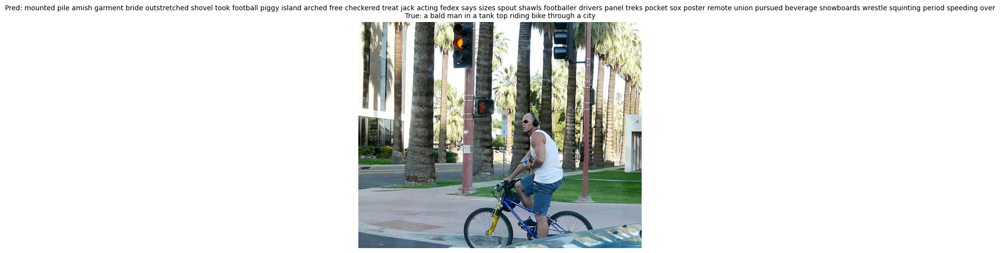


True Caption: a man in a black shirt and jeans is backing away from a fire on a stove
Pred Caption: youngsters bass sox leafcovered zoo utensils jumps flips heels atm overhang sniffing turquoise auditorium historic teams bmw embankment campus bottle piles beak formal blurry spiderman blurred occupied surf customer bananas upturned points gyro spins electronics through bat camcorder forefront
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.000 | ROUGE-L: 0.000


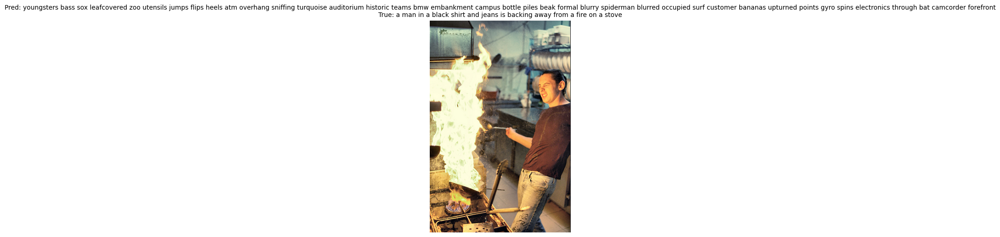


True Caption: two dogs stand back to back in the ocean
Pred Caption: compete beauty starting fanny oklahoma carriage figures filling holder police fanny litter tote hut hind contemplates called bin treat roll slab makeup
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.049 | ROUGE-L: 0.000


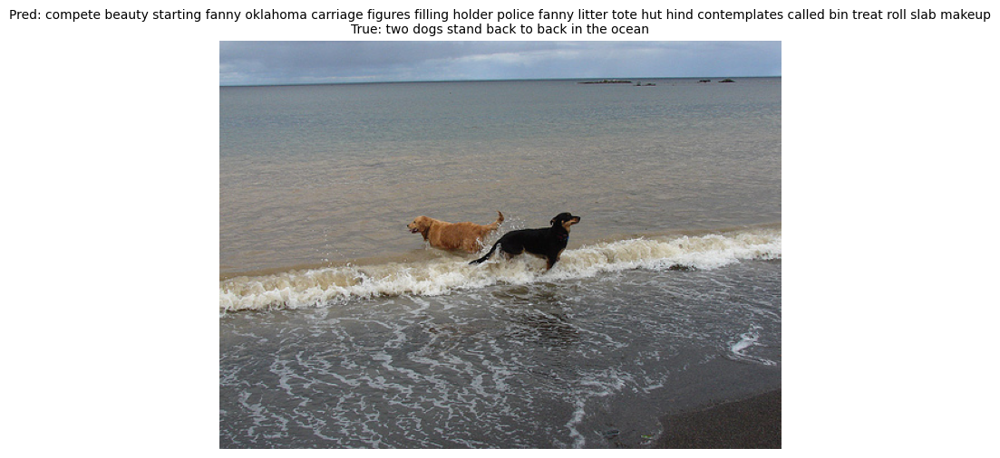


True Caption: man and woman standing together on a cobbled street having their picture taken
Pred Caption: puck overhanging begging x and lead lounging waterskier vampire substance japanese puzzled skiing suited step logos tightrope twirl outside leading barn snowmobiles socks receiving catches built popping sweatshirts overpass splashed pails umbrella easel wasteland exit rapids doggy lane strikes
BLEU-1: 0.026 | BLEU-2: 0.008 | BLEU-3: 0.006 | BLEU-4: 0.005
METEOR: 0.032 | ROUGE-L: 0.038


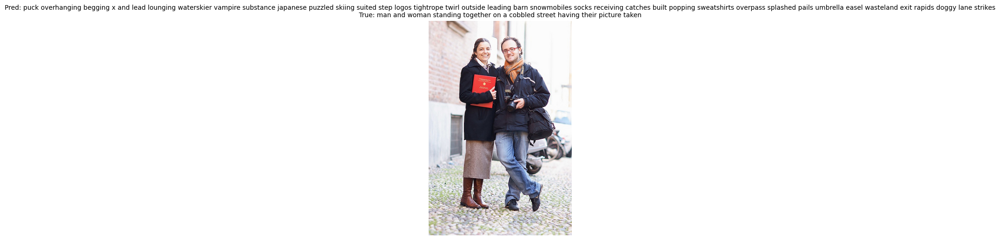


True Caption: a skateboarder is airborne in front of some low brick buildings
Pred Caption: rollerskating chat same doorstep matching viz small charging lifted pitcher strike twilight quad metro parking stunning signing graffitifilled dances lolly mans potato emerging rack tartan s donuts bands heart ten beagle mingle headlong cup extremely railway gathers owner gowns
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.036 | ROUGE-L: 0.000


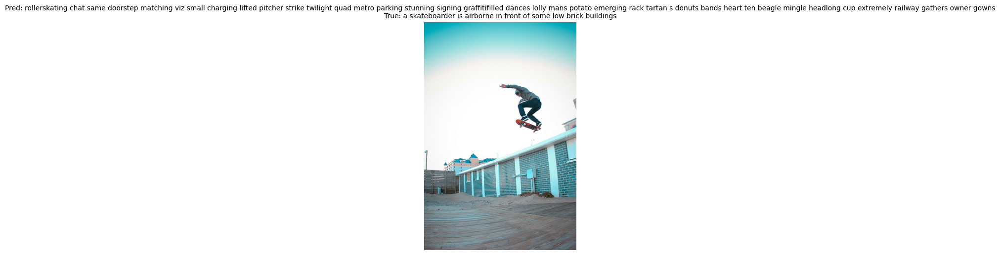


True Caption: a skateboarder is airborne between a white building and an american flag
Pred Caption: post protesters dads electronics it
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.000 | ROUGE-L: 0.000


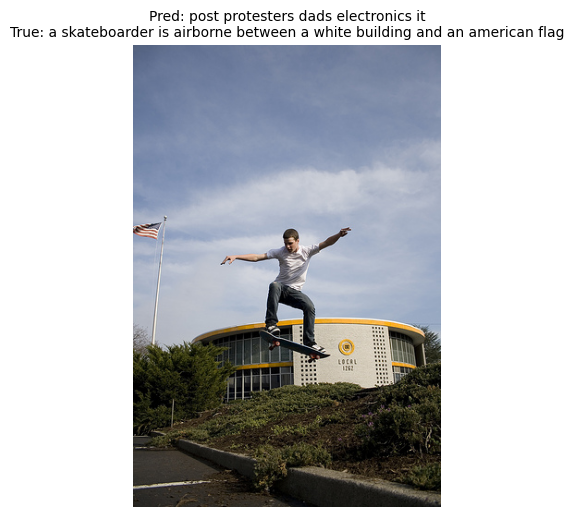


True Caption: a group of women are performing onstage
Pred Caption: helps treefilled behind wearing exercises tuxes out early wake three curlyhaired ritz leaping muzzled gestures miami arrow garb upward tossed pet snowmobiling guy collared pipe alone defenders meter upside furnace opposite aerial padded steam lawnmower deflated throw break special
BLEU-1: 0.000 | BLEU-2: 0.000 | BLEU-3: 0.000 | BLEU-4: 0.000
METEOR: 0.000 | ROUGE-L: 0.000


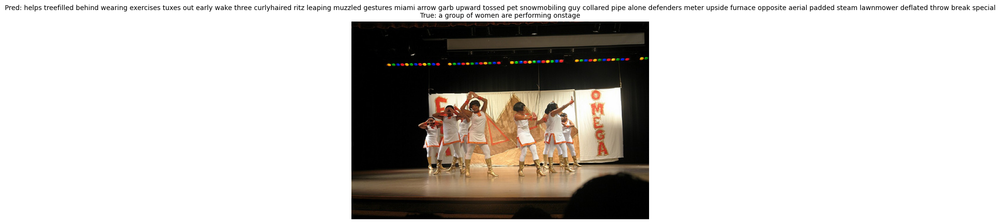


True Caption: two race cars speed along a track with smoke coming from the backs of them
Pred Caption: leaps flannel cob jackets bars mr caution competitor crying speedboat horse crosswalk crumbling man ok else groom swampy castle creating archway goatee sombrero lady wrecked give clowns winking cheering logs dyed frolics tired visitors by speed behind lime grimacing
BLEU-1: 0.026 | BLEU-2: 0.008 | BLEU-3: 0.006 | BLEU-4: 0.005
METEOR: 0.029 | ROUGE-L: 0.037


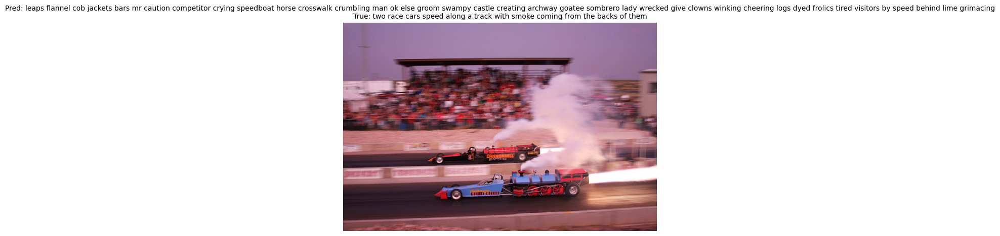


Calculating corpus BLEU on 500 samples...


  0%|          | 0/500 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:

!pip -q install nltk rouge-score

import nltk
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
from rouge_score import rouge_scorer
import numpy as np


nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)



def calculate_bleu_scores(reference, candidate):
    """Calculate BLEU-1, BLEU-2, BLEU-3, BLEU-4 scores"""
    reference = [reference.split()]
    candidate = candidate.split()

    smooth = SmoothingFunction()

    bleu1 = sentence_bleu(reference, candidate, weights=(1, 0, 0, 0),
                          smoothing_function=smooth.method1)
    bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0),
                          smoothing_function=smooth.method1)
    bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.33, 0),
                          smoothing_function=smooth.method1)
    bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25),
                          smoothing_function=smooth.method1)

    return bleu1, bleu2, bleu3, bleu4


def calculate_meteor(reference, candidate):
    """Calculate METEOR score"""
    return meteor_score([reference.split()], candidate.split())


def calculate_rouge(reference, candidate):
    """Calculate ROUGE-L score"""
    scorer = rouge_scorer.RougeScorer(['rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores['rougeL'].fmeasure




def evaluate_model(num_samples=500):
    """Evaluate model on validation set"""
    num_samples = min(num_samples, len(val_imgs))

    bleu1_scores = []
    bleu2_scores = []
    bleu3_scores = []
    bleu4_scores = []
    meteor_scores = []
    rouge_scores = []

    print(f"Evaluating on {num_samples} validation samples...")

    for i in tqdm(range(num_samples)):
        img_path = val_imgs[i]
        true_caption = val_captions[i].replace('<start> ', '').replace(' <end>', '').replace('<unk>', '')

        # Generate prediction
        pred_caption = generate_caption(img_path)

        
        b1, b2, b3, b4 = calculate_bleu_scores(true_caption, pred_caption)
        bleu1_scores.append(b1)
        bleu2_scores.append(b2)
        bleu3_scores.append(b3)
        bleu4_scores.append(b4)

        meteor_scores.append(calculate_meteor(true_caption, pred_caption))
        rouge_scores.append(calculate_rouge(true_caption, pred_caption))

    # Calculate average scores
    results = {
        'BLEU-1': np.mean(bleu1_scores),
        'BLEU-2': np.mean(bleu2_scores),
        'BLEU-3': np.mean(bleu3_scores),
        'BLEU-4': np.mean(bleu4_scores),
        'METEOR': np.mean(meteor_scores),
        'ROUGE-L': np.mean(rouge_scores)
    }

    return results, bleu1_scores, bleu2_scores, bleu3_scores, bleu4_scores, meteor_scores, rouge_scores



results, b1, b2, b3, b4, meteor, rouge = evaluate_model(num_samples=500)

print("\n" + "="*50)
print("EVALUATION RESULTS")
print("="*50)
for metric, score in results.items():
    print(f"{metric:12s}: {score:.4f}")
print("="*50)


fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Evaluation Metrics Distribution', fontsize=16)

metrics_data = [
    (b1, 'BLEU-1', axes[0, 0]),
    (b2, 'BLEU-2', axes[0, 1]),
    (b3, 'BLEU-3', axes[0, 2]),
    (b4, 'BLEU-4', axes[1, 0]),
    (meteor, 'METEOR', axes[1, 1]),
    (rouge, 'ROUGE-L', axes[1, 2])
]

for data, title, ax in metrics_data:
    ax.hist(data, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
    ax.set_title(f'{title} Distribution\nMean: {np.mean(data):.4f}')
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



def show_sample_predictions(n=10):
    """Show n random samples with predictions and scores"""
    indices = random.sample(range(len(val_imgs)), n)

    for idx in indices:
        img_path = val_imgs[idx]
        true_caption = val_captions[idx].replace('<start> ', '').replace(' <end>', '')
        pred_caption = generate_caption(img_path)

        # Calculate metrics
        b1, b2, b3, b4 = calculate_bleu_scores(true_caption, pred_caption)
        met = calculate_meteor(true_caption, pred_caption)
        rou = calculate_rouge(true_caption, pred_caption)

        print("\n" + "="*80)
        print(f"True Caption: {true_caption}")
        print(f"Pred Caption: {pred_caption}")
        print(f"BLEU-1: {b1:.3f} | BLEU-2: {b2:.3f} | BLEU-3: {b3:.3f} | BLEU-4: {b4:.3f}")
        print(f"METEOR: {met:.3f} | ROUGE-L: {rou:.3f}")

        # Display image
        img = Image.open(img_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(f"Pred: {pred_caption}\nTrue: {true_caption}", fontsize=10)
        plt.axis('off')
        plt.show()

print("\n" + "="*80)
print("SAMPLE PREDICTIONS WITH SCORES")
print("="*80)
show_sample_predictions(n=10)



def calculate_corpus_bleu(num_samples=500):
    """Calculate corpus-level BLEU score"""
    num_samples = min(num_samples, len(val_imgs))

    references = []
    candidates = []

    print(f"\nCalculating corpus BLEU on {num_samples} samples...")

    for i in tqdm(range(num_samples)):
        img_path = val_imgs[i]
        true_caption = val_captions[i].replace('<start> ', '').replace(' <end>', '')
        pred_caption = generate_caption(img_path)

        references.append([true_caption.split()])
        candidates.append(pred_caption.split())

    corpus_bleu_score = corpus_bleu(references, candidates)

    print(f"\nCorpus BLEU Score: {corpus_bleu_score:.4f}")
    return corpus_bleu_score


corpus_bleu_score = calculate_corpus_bleu(num_samples=500)

print("\n✅ Evaluation complete!")